<a href="https://colab.research.google.com/github/gonzaloelejalde/piii-2025/blob/main/clase06/clase06.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Ejercicio 12

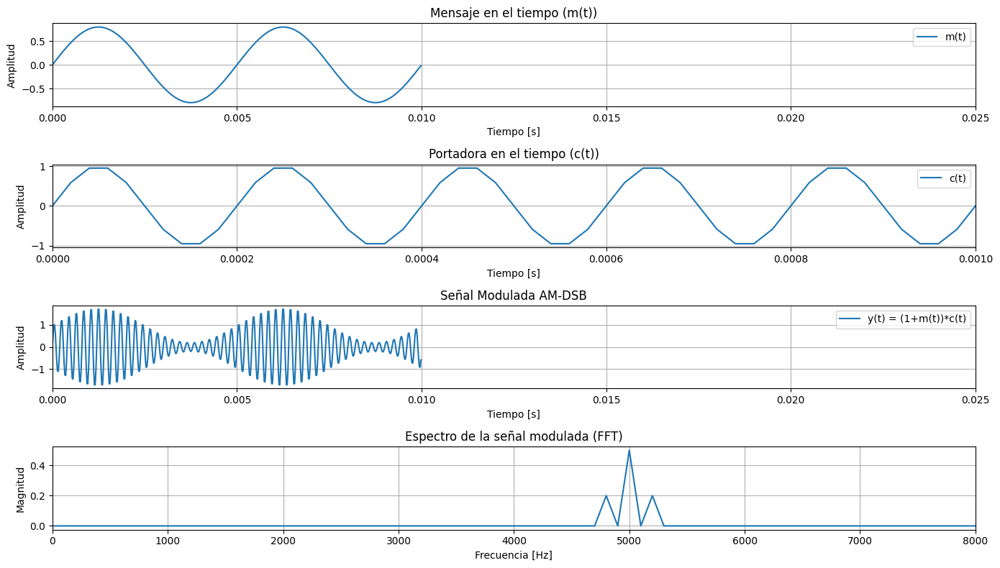

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros
fs = 50000        # Frecuencia de muestreo (50 kHz para buena resolución)
T = 0.01          # Duración de la señal en segundos (10 ms)
t = np.arange(0, T, 1/fs)

# Señal mensaje (puedes variar la amplitud para probar sobremodulación)
Am = 0.8          # Amplitud del mensaje (prueba con 0.5, 1.0, 1.5, etc.)
fm = 200          # Frecuencia del mensaje (200 Hz)
m = Am * np.sin(2*np.pi*fm*t)

# Señal portadora
Ac = 1.0          # Amplitud de la portadora
fc = 5000         # Frecuencia de la portadora (5 kHz)
c = Ac * np.sin(2*np.pi*fc*t)

# Señal modulada AM-DSB
y = (1 + m) * c

# --- Gráficos ---
plt.figure(figsize=(14,8))

# Mensaje
plt.subplot(4,1,1)
plt.plot(t, m, label="m(t)")
plt.xlim(0, 5/fm)  # mostrar 5 periodos del mensaje
plt.title("Mensaje en el tiempo (m(t))")
plt.xlabel("Tiempo [s]")
plt.ylabel("Amplitud")
plt.grid(True)
plt.legend()

# Portadora (zoom)
plt.subplot(4,1,2)
plt.plot(t, c, label="c(t)")
plt.xlim(0, 5/fc)  # mostrar 5 periodos de la portadora
plt.title("Portadora en el tiempo (c(t))")
plt.xlabel("Tiempo [s]")
plt.ylabel("Amplitud")
plt.grid(True)
plt.legend()

# Señal modulada
plt.subplot(4,1,3)
plt.plot(t, y, label="y(t) = (1+m(t))*c(t)")
plt.xlim(0, 5/fm)  # unos pocos periodos del mensaje para ver la envolvente
plt.title("Señal Modulada AM-DSB")
plt.xlabel("Tiempo [s]")
plt.ylabel("Amplitud")
plt.grid(True)
plt.legend()

# Espectro (FFT hasta 8 kHz)
N = len(y)
Y = np.fft.fft(y)
freqs = np.fft.fftfreq(N, 1/fs)
Y_mag = np.abs(Y)/N

plt.subplot(4,1,4)
plt.plot(freqs[:N//2], Y_mag[:N//2])
plt.xlim(0, 8000)
plt.title("Espectro de la señal modulada (FFT)")
plt.xlabel("Frecuencia [Hz]")
plt.ylabel("Magnitud")
plt.grid(True)

plt.tight_layout()
plt.show()


Cuando el índice de modulación supera el valor 1 (es decir, cuando la amplitud del mensaje es mayor que la de la portadora), la envolvente de la señal modulada ya no puede seguir fielmente la forma del mensaje.

En condiciones normales (índice ≤ 1), la portadora queda “recubierta” por la envolvente que tiene exactamente la forma del mensaje. Pero si el índice > 1, ocurre que en algunos puntos el mensaje hace que la envolvente baje por debajo de cero, invirtiéndose la fase de la portadora en esos tramos

¿Que se espera en el grafico de la frecuencia? ¿Que seria llevar la portadora? ¿Y la que no se lleva (la que esta suprimida), para que se usa?

En el gráfico de frecuencia de una señal AM con portadora se espera ver un pico fuerte en la frecuencia de la portadora y, además, dos bandas laterales alrededor de ella: una en la suma (portadora + frecuencia del mensaje) y otra en la resta (portadora – frecuencia del mensaje). Esas bandas laterales son las que realmente contienen la información del mensaje.

Cuando la portadora no se lleva (AM con portadora suprimida), solo se transmiten las bandas laterales. Eso hace que la transmisión sea más eficiente en potencia, ya que todo lo que se envía corresponde a información útil. La desventaja es que en el receptor hace falta un oscilador local que “recree” la portadora, porque si no, no se puede demodular correctamente.

Ejercicio 13


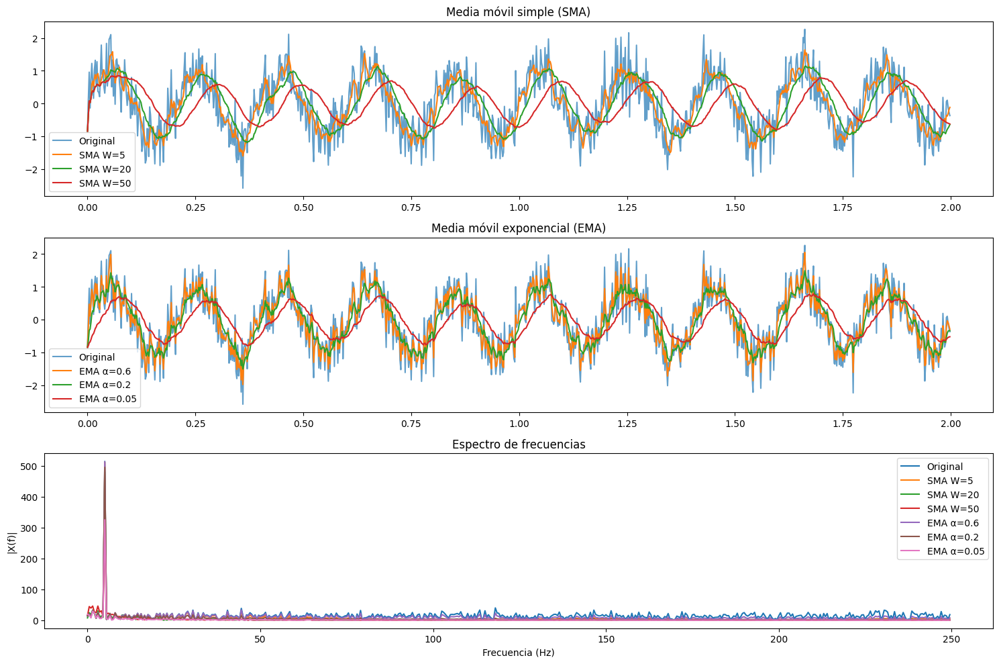

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# ===============================
# 1. Señal de prueba (seno + ruido)
# ===============================
fs = 500        # frecuencia de muestreo (Hz)
t = np.arange(0, 2, 1/fs)  # 2 segundos
f0 = 5          # frecuencia de la señal principal (Hz)
x = np.sin(2*np.pi*f0*t) + 0.5*np.random.randn(len(t))  # señal ruidosa

# ===============================
# 2. Media móvil simple (SMA)
# ===============================
def moving_average(x, W):
    """Filtro de media móvil simple usando ecuación recursiva"""
    y = np.zeros(len(x))
    for n in range(len(x)):
        if n < W:
            y[n] = np.mean(x[:n+1])  # inicio: promedio parcial
        else:
            y[n] = y[n-1] + (1/W)*(x[n] - x[n-W])
    return y

# Distintos tamaños de ventana
W_list = [5, 20, 50]
sma_signals = [moving_average(x, W) for W in W_list]

# ===============================
# 3. Media móvil exponencial (EMA)
# ===============================
def exponential_moving_average(x, alpha):
    """Filtro de media móvil exponencial"""
    y = np.zeros(len(x))
    y[0] = x[0]
    for n in range(1, len(x)):
        y[n] = alpha*x[n] + (1-alpha)*y[n-1]
    return y

alpha_values = [0.6, 0.2, 0.05]
ema_signals = [exponential_moving_average(x, a) for a in alpha_values]

# ===============================
# 4. Análisis en frecuencia (FFT)
# ===============================
def plot_fft(signal, fs, label):
    N = len(signal)
    Xf = np.fft.fft(signal)
    f = np.fft.fftfreq(N, 1/fs)
    plt.plot(f[:N//2], np.abs(Xf[:N//2]), label=label)

# ===============================
# 5. Graficar resultados
# ===============================

plt.figure(figsize=(15,10))

# Señal original y SMA
plt.subplot(3,1,1)
plt.plot(t, x, label="Original", alpha=0.7)
for W, y in zip(W_list, sma_signals):
    plt.plot(t, y, label=f"SMA W={W}")
plt.legend()
plt.title("Media móvil simple (SMA)")

# Señal original y EMA
plt.subplot(3,1,2)
plt.plot(t, x, label="Original", alpha=0.7)
for a, y in zip(alpha_values, ema_signals):
    plt.plot(t, y, label=f"EMA α={a}")
plt.legend()
plt.title("Media móvil exponencial (EMA)")

# Espectro
plt.subplot(3,1,3)
plot_fft(x, fs, "Original")
for W, y in zip(W_list, sma_signals):
    plot_fft(y, fs, f"SMA W={W}")
for a, y in zip(alpha_values, ema_signals):
    plot_fft(y, fs, f"EMA α={a}")
plt.legend()
plt.title("Espectro de frecuencias")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("|X(f)|")

plt.tight_layout()
plt.show()


Ejercicio 14


Código profe

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio

def generate_shepard_tone(base_freq, num_tones, duration, sample_rate):
    t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
    tone = np.zeros_like(t)

    for i in range(num_tones):
        freq = base_freq * (2 ** i)
        amplitude = np.sin(np.pi * i / num_tones) ** 2
        tone += amplitude * np.sin(2 * np.pi * freq * t)

    return tone

# Parámetros
base_freq = 440  # Frecuencia base en Hz (Nota La)
num_tones = 6    # Número de tonos superpuestos
duration = 0.5   # Duración de cada tono en segundos
sample_rate = 44100  # Tasa de muestreo

# Generar el tono de Shepard
shepard_tone = generate_shepard_tone(base_freq, num_tones, duration, sample_rate)

# Reproducir el tono generado
Audio(shepard_tone, rate=sample_rate)

def generate_shepard_scale(base_freq, num_tones, duration, sample_rate, steps):
    scale = []
    for step in range(steps):
        tone = generate_shepard_tone(base_freq * (2 ** (step / steps)), num_tones, duration, sample_rate)
        scale.append(tone)
    return np.concatenate(scale)

# Parámetros adicionales
steps = 100  # Número de pasos en la escala (equivalente a una octava)

# Generar la escala de Shepard
shepard_scale = generate_shepard_scale(base_freq, num_tones, duration, sample_rate, steps)

# Reproducir la escala
Audio(shepard_scale, rate=sample_rate)

Los Tonos de Shepard son una serie de tonos puros que, cuando se reproducen en secuencia, crean la ilusión auditiva de un tono que sube o baja infinitamente en altura, a pesar de que en realidad no ocurre un cambio real en la frecuencia.
Los Tonos de Shepard consisten en varios tonos sinusoidales espaciados por octavas. Al variar la amplitud de estos tonos de forma que los extremos (frecuencias más bajas y más altas) se atenúan, se crea una ilusión de un tono que parece subir o bajar infinitamente.
Psicoacústica: La percepción de los Tonos de Shepard explota una característica de nuestro sistema auditivo: la capacidad de identificar tonos en diferentes rangos de frecuencia, pero sin una clara distinción cuando los tonos están compuestos de múltiples frecuencias.

Ascendente:


Descendente:


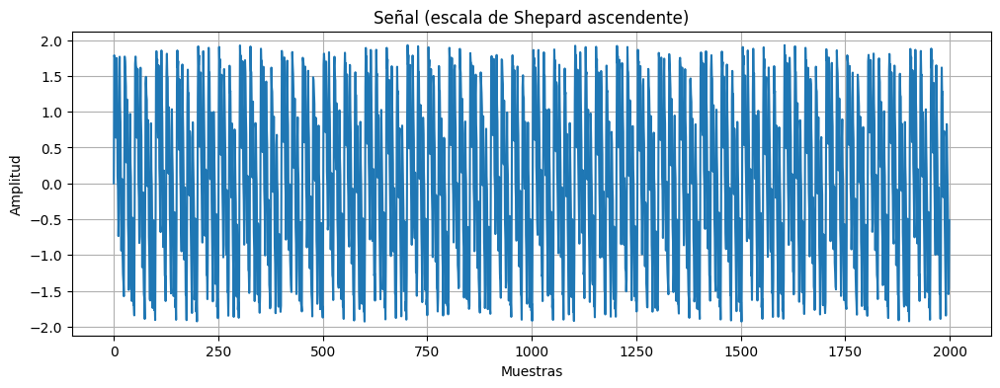

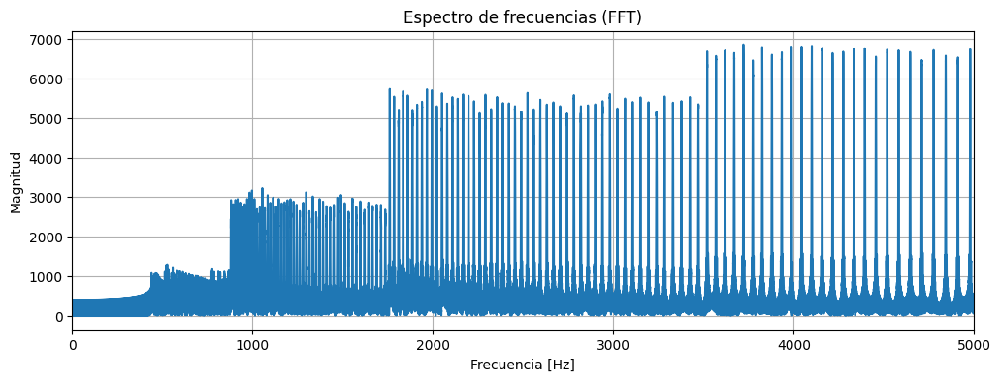

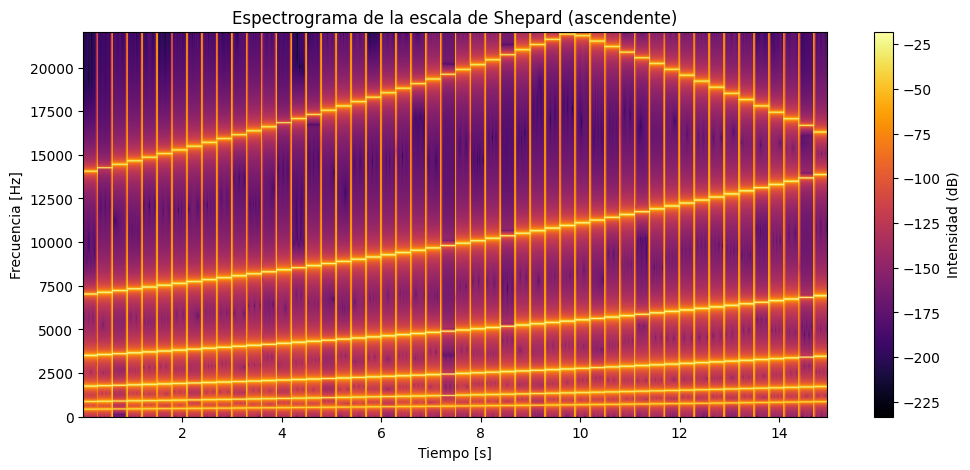

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio

# --- Función para generar un tono de Shepard ---
def generate_shepard_tone(base_freq, num_tones, duration, sample_rate):
    t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
    tone = np.zeros_like(t)

    for i in range(num_tones):
        freq = base_freq * (2 ** i)
        # Envolvente gaussiana para atenuar extremos
        amplitude = np.exp(-0.5 * ((i - num_tones/2) / (num_tones/4))**2)
        tone += amplitude * np.sin(2 * np.pi * freq * t)

    return tone

# --- Escala ascendente/descendente ---
def generate_shepard_scale(base_freq, num_tones, duration, sample_rate, steps, direction="up"):
    scale = []
    for step in range(steps):
        if direction == "up":
            freq = base_freq * (2 ** (step / steps))
        elif direction == "down":
            freq = base_freq * (2 ** (-step / steps))
        tone = generate_shepard_tone(freq, num_tones, duration, sample_rate)
        scale.append(tone)
    return np.concatenate(scale)

# --- Parámetros ---
base_freq = 440     # frecuencia base (Hz)
num_tones = 6       # cantidad de sinusoides superpuestas
duration = 0.3      # duración de cada tono (segundos)
sample_rate = 44100 # tasa de muestreo
steps = 50          # pasos en la escala (equivale a una octava)

# Generar escalas
shepard_up = generate_shepard_scale(base_freq, num_tones, duration, sample_rate, steps, "up")
shepard_down = generate_shepard_scale(base_freq, num_tones, duration, sample_rate, steps, "down")

# --- Reproducir ---
print("Ascendente:")
display(Audio(shepard_up, rate=sample_rate))
print("Descendente:")
display(Audio(shepard_down, rate=sample_rate))

# --- Señal en el tiempo ---
plt.figure(figsize=(12,4))
plt.plot(shepard_up[:2000])  # primeras muestras
plt.title("Señal (escala de Shepard ascendente)")
plt.xlabel("Muestras")
plt.ylabel("Amplitud")
plt.grid(True)
plt.show()

# --- Espectro de frecuencias ---
freqs = np.fft.rfftfreq(len(shepard_up), 1/sample_rate)
spectrum = np.abs(np.fft.rfft(shepard_up))

plt.figure(figsize=(12,4))
plt.plot(freqs, spectrum)
plt.title("Espectro de frecuencias (FFT)")
plt.xlabel("Frecuencia [Hz]")
plt.ylabel("Magnitud")
plt.xlim(0, 5000)  # limitar para ver mejor
plt.grid(True)
plt.show()

# --- Espectrograma ---
plt.figure(figsize=(12,5))
plt.specgram(shepard_up, Fs=sample_rate, NFFT=2048, noverlap=1024, cmap="inferno")
plt.title("Espectrograma de la escala de Shepard (ascendente)")
plt.xlabel("Tiempo [s]")
plt.ylabel("Frecuencia [Hz]")
plt.colorbar(label="Intensidad (dB)")
plt.show()


¿Qué ocurre si cambia la tasa de muestreo o la duración de cada tono?
En los tonos de Shepard la tasa de muestreo (sample_rate) y la duración de cada tono (duration) afectan tanto la calidad técnica de la señal como la percepción de la ilusión.